## ⚡ Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Sat Oct 28 15:28:23 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install YOLO-NAS


In [ ]:
# !pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
!pip install super-gradients
!pip install imutils
!pip install -q roboflow
!pip install -q supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 62.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 107.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 105.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 107.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 103.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 9.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0

### 🚨 Restart the runtime

**After installation is complete, you'll need to restart the runtime after installation completes. Navigate to `Runtime` -> `Restart runtime` and confirm by clicking `Yes` when you see the popup.**

After that, carry on with the notebook starting from the cell below 👇

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Inference with pre-trained COCO model

Start by instantiating a pretrained model. YOLO-NAS architecture comes in three different sizes: `yolo_nas_s`, `yolo_nas_m`, `and yolo_nas_l`. We will use `yolo_nas_l` throughout this notebook. Keep in mind that depending on your use-case your decision may be different. Take a peek at the diagram below visualizing the speed-accuracy tradeoff.

<br>

![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)


In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [ ]:
from super_gradients.training import models

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

The console stream is logged into /root/sg_logs/console.log


[2023-10-28 15:30:14] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-10-28 15:30:14] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-10-28 15:30:23] INFO - utils.py - NumExpr defaulting to 2 threads.
[2023-10-28 15:30:27] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-10-28 15:30:27] WARNING - export.py - Failed to import pytorch_quantization
[2023-10-28 15:30:27] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-10-28 15:30:29] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/ch

### Output format

For every image YOLO-NAS will produce `ImageDetectionPrediction` object containing the following fields:
- `image` - `numpy.ndarray` - image used for inference
- `class_names` - `List[str]` - list of categories used for training the model
- `prediction` - `DetectionPrediction` - class instance containing detailed informationabout the obtained detections
   - `bboxes_xyxy` - `numpy.ndarray` of `float32` and `(N, 4)` shape - detection bounding boxes in `xyxy` format
   - `confidence` - `numpy.ndarray` of `float32` and `(N,)` shape - confidence value between `0` and `1`
   - `labels` - `numpy.ndarray` of `float32` and `(N,)` shape - `class_id` related to the index in the `class_names` list

## Train YOLO-NAS on custom dataset

In [ ]:
%cd {HOME}

import roboflow
from roboflow import Roboflow

roboflow.login()

rf = Roboflow()

project = rf.workspace("david-lee-d0rhs").project("american-sign-language-letters")
dataset = project.version(1).download("yolov5")

/content
visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to American-Sign-Language-Letters-1 in yolov5pytorch::   0%|          | 0/3458 [00:00<?, ?it/s]

Extracting Dataset Version Zip to American-Sign-Language-Letters-1 in yolov5pytorch::  53%|█████▎    | 1836/3458 [00:00<00:00, 9090.55it/s]

In [ ]:
LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [ ]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 8
MAX_EPOCHS = 50
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

Extracting Dataset Version Zip to American-Sign-Language-Letters-1 in yolov5pytorch:: 100%|██████████| 3458/3458 [00:00<00:00, 10462.76it/s]


location: /content/American-Sign-Language-Letters-1
classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


[2023-10-28 15:30:54] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 1512/1512 [00:00<00:00, 6014.03it/s]
[2023-10-28 15:30:54] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 144/144 [00:00<00:00, 6478.25it/s]
[2023-10-28 15:30:55] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


**NOTE:** Let's inspect our dataset

In [ ]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': (640, 640), 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': (640, 640), 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5),
 DetectionPaddedRescale('additional_samples_count': 0, 'non_em

Indexing dataset annotations: 100%|██████████| 72/72 [00:00<00:00, 5486.04it/s]


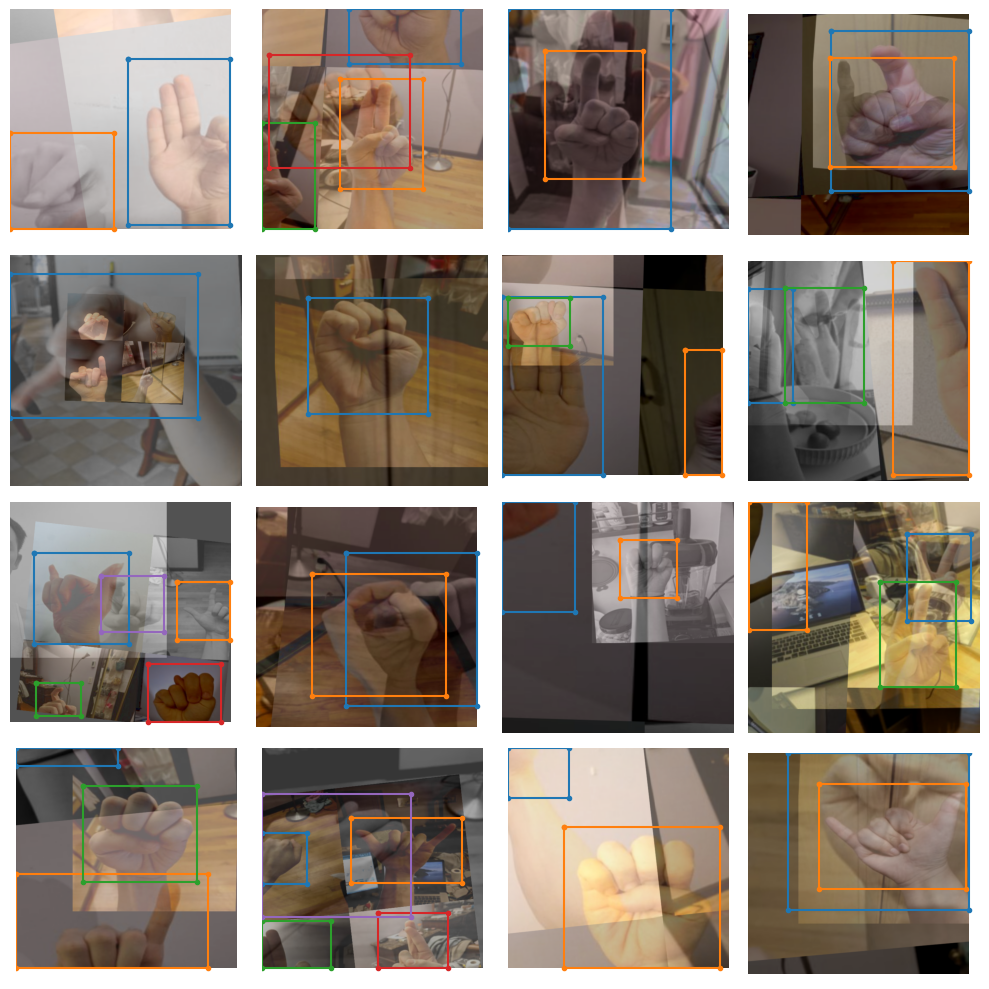

In [ ]:
train_data.dataset.plot(plot_transformed_data=True)

In [ ]:
## removing MixUp augmentaion
train_data.dataset.transforms.pop(2)

DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114)

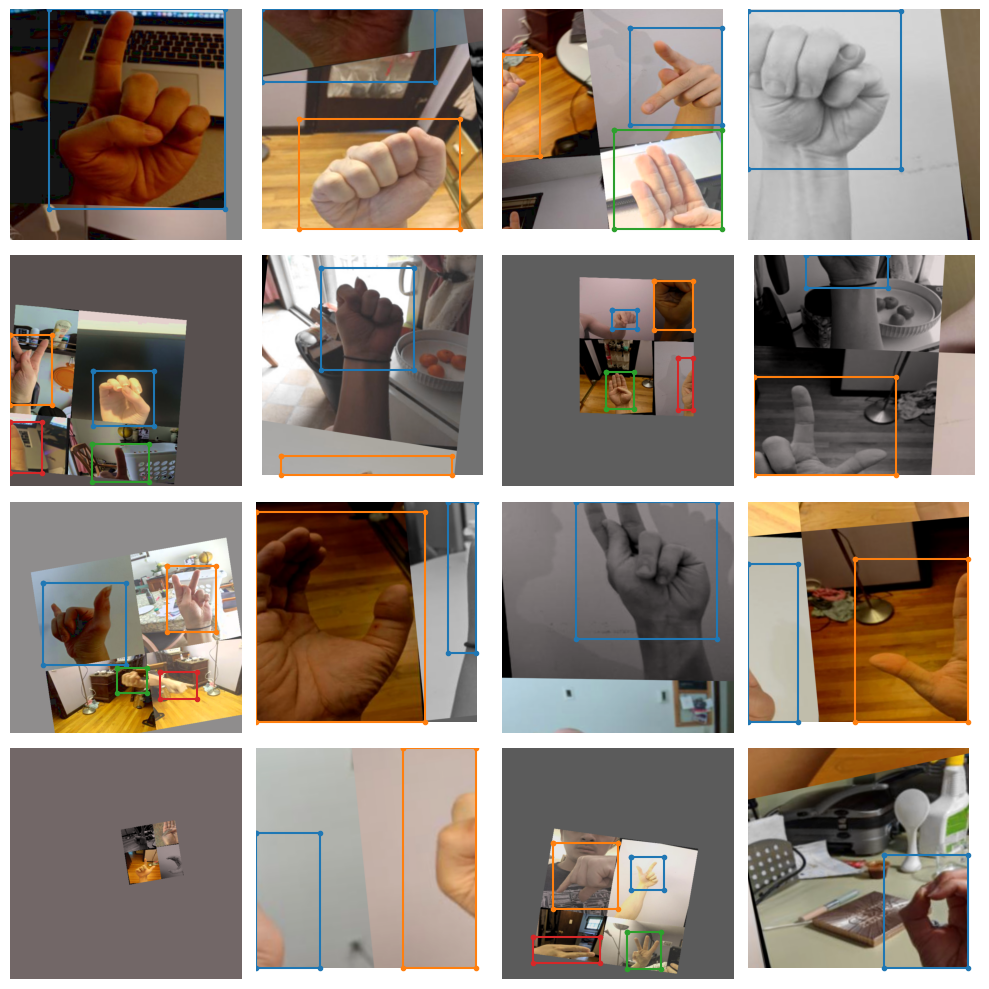

In [ ]:
train_data.dataset.plot(plot_transformed_data=True)

### Instantiate the model

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2023-10-28 15:31:00] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-10-28 15:31:00] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


### Define metrics and training parameters

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard

In [ ]:
# !kill 282

### Train the model

In [ ]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

[2023-10-28 15:31:06] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231028_153106_715228`
[2023-10-28 15:31:06] INFO - sg_trainer.py - Checkpoints directory: /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228
[2023-10-28 15:31:06] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/console_Oct28_15_31_06.txt


Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
[2023-10-28 15:31:08] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            1512       (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         189        (len(train_loader))
    - Gradient updates per epoch:   189        (len(train_loader) / batch_accumulate)

[2023-10-28 15:31:08] INFO - sg_trainer.py - Started training for 50 epochs (0/49)

Validating: 100%|██████████| 18/18 [00:07<00:00,  2.38it/s]
[2023-10-28 15:33:41] INFO - base_sg_logger.py - Checkpoint

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.2999
│   ├── Ppyoloeloss/loss_iou = 0.2364
│   ├── Ppyoloeloss/loss_dfl = 1.5749
│   └── Ppyoloeloss/loss = 3.6782
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.6557
    ├── Ppyoloeloss/loss_iou = 0.1526
    ├── Ppyoloeloss/loss_dfl = 1.2723
    ├── Ppyoloeloss/loss = 3.6733
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0046
    └── F1@0.50 = 0.0



Validating epoch 1: 100%|██████████| 18/18 [00:07<00:00,  2.41it/s]
[2023-10-28 15:36:02] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 15:36:02] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.12993408739566803


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.0099
│   │   ├── Epoch N-1      = 2.2999 (↘ -0.29)
│   │   └── Best until now = 2.2999 (↘ -0.29)
│   ├── Ppyoloeloss/loss_iou = 0.165
│   │   ├── Epoch N-1      = 0.2364 (↘ -0.0714)
│   │   └── Best until now = 0.2364 (↘ -0.0714)
│   ├── Ppyoloeloss/loss_dfl = 1.2705
│   │   ├── Epoch N-1      = 1.5749 (↘ -0.3044)
│   │   └── Best until now = 1.5749 (↘ -0.3044)
│   └── Ppyoloeloss/loss = 3.0576
│       ├── Epoch N-1      = 3.6782 (↘ -0.6206)
│       └── Best until now = 3.6782 (↘ -0.6206)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.7074
    │   ├── Epoch N-1      = 2.6557 (↘ -0.9483)
    │   └── Best until now = 2.6557 (↘ -0.9483)
    ├── Ppyoloeloss/loss_iou = 0.2124
    │   ├── Epoch N-1      = 0.1526 (↗ 0.0598)
    │   └── Best until now = 0.1526 (↗ 0.0598)
    ├── Ppyoloeloss/loss_dfl = 1.6956
    │   ├── Epoch N-1      = 1.2723 (↗ 0.4233)
    │   └── Best until now = 1.2723 (↗ 0.4233)
    ├── Ppyoloeloss/loss = 3.08

Validating epoch 2: 100%|██████████| 18/18 [00:07<00:00,  2.46it/s]
[2023-10-28 15:38:35] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 15:38:35] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.14521394670009613


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.7067
│   │   ├── Epoch N-1      = 2.0099 (↘ -0.3032)
│   │   └── Best until now = 2.0099 (↘ -0.3032)
│   ├── Ppyoloeloss/loss_iou = 0.1848
│   │   ├── Epoch N-1      = 0.165  (↗ 0.0198)
│   │   └── Best until now = 0.165  (↗ 0.0198)
│   ├── Ppyoloeloss/loss_dfl = 1.3355
│   │   ├── Epoch N-1      = 1.2705 (↗ 0.065)
│   │   └── Best until now = 1.2705 (↗ 0.065)
│   └── Ppyoloeloss/loss = 2.8364
│       ├── Epoch N-1      = 3.0576 (↘ -0.2212)
│       └── Best until now = 3.0576 (↘ -0.2212)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.8912
    │   ├── Epoch N-1      = 1.7074 (↗ 0.1838)
    │   └── Best until now = 1.7074 (↗ 0.1838)
    ├── Ppyoloeloss/loss_iou = 0.231
    │   ├── Epoch N-1      = 0.2124 (↗ 0.0186)
    │   └── Best until now = 0.1526 (↗ 0.0784)
    ├── Ppyoloeloss/loss_dfl = 1.7844
    │   ├── Epoch N-1      = 1.6956 (↗ 0.0888)
    │   └── Best until now = 1.2723 (↗ 0.5121)
    ├── Ppyoloeloss/loss = 3.3607
 

Validating epoch 3: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]
[2023-10-28 15:41:10] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 15:41:10] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.198332279920578


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.6632
│   │   ├── Epoch N-1      = 1.7067 (↘ -0.0435)
│   │   └── Best until now = 1.7067 (↘ -0.0435)
│   ├── Ppyoloeloss/loss_iou = 0.1849
│   │   ├── Epoch N-1      = 0.1848 (↗ 1e-04)
│   │   └── Best until now = 0.165  (↗ 0.0199)
│   ├── Ppyoloeloss/loss_dfl = 1.3301
│   │   ├── Epoch N-1      = 1.3355 (↘ -0.0054)
│   │   └── Best until now = 1.2705 (↗ 0.0596)
│   └── Ppyoloeloss/loss = 2.7905
│       ├── Epoch N-1      = 2.8364 (↘ -0.0459)
│       └── Best until now = 2.8364 (↘ -0.0459)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.5421
    │   ├── Epoch N-1      = 1.8912 (↘ -0.3491)
    │   └── Best until now = 1.7074 (↘ -0.1653)
    ├── Ppyoloeloss/loss_iou = 0.2183
    │   ├── Epoch N-1      = 0.231  (↘ -0.0126)
    │   └── Best until now = 0.1526 (↗ 0.0658)
    ├── Ppyoloeloss/loss_dfl = 1.7244
    │   ├── Epoch N-1      = 1.7844 (↘ -0.0599)
    │   └── Best until now = 1.2723 (↗ 0.4522)
    ├── Ppyoloeloss/loss = 2

Validating epoch 4: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]
[2023-10-28 15:43:54] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 15:43:54] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.20209237933158875


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.63
│   │   ├── Epoch N-1      = 1.6632 (↘ -0.0332)
│   │   └── Best until now = 1.6632 (↘ -0.0332)
│   ├── Ppyoloeloss/loss_iou = 0.1729
│   │   ├── Epoch N-1      = 0.1849 (↘ -0.012)
│   │   └── Best until now = 0.165  (↗ 0.0079)
│   ├── Ppyoloeloss/loss_dfl = 1.2837
│   │   ├── Epoch N-1      = 1.3301 (↘ -0.0464)
│   │   └── Best until now = 1.2705 (↗ 0.0132)
│   └── Ppyoloeloss/loss = 2.7042
│       ├── Epoch N-1      = 2.7905 (↘ -0.0863)
│       └── Best until now = 2.7905 (↘ -0.0863)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.5185
    │   ├── Epoch N-1      = 1.5421 (↘ -0.0236)
    │   └── Best until now = 1.5421 (↘ -0.0236)
    ├── Ppyoloeloss/loss_iou = 0.2033
    │   ├── Epoch N-1      = 0.2183 (↘ -0.015)
    │   └── Best until now = 0.1526 (↗ 0.0508)
    ├── Ppyoloeloss/loss_dfl = 1.6136
    │   ├── Epoch N-1      = 1.7244 (↘ -0.1108)
    │   └── Best until now = 1.2723 (↗ 0.3413)
    ├── Ppyoloeloss/loss = 2.8

Validating epoch 5: 100%|██████████| 18/18 [00:07<00:00,  2.54it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5698
│   │   ├── Epoch N-1      = 1.63   (↘ -0.0602)
│   │   └── Best until now = 1.63   (↘ -0.0602)
│   ├── Ppyoloeloss/loss_iou = 0.1648
│   │   ├── Epoch N-1      = 0.1729 (↘ -0.0081)
│   │   └── Best until now = 0.165  (↘ -0.0002)
│   ├── Ppyoloeloss/loss_dfl = 1.2357
│   │   ├── Epoch N-1      = 1.2837 (↘ -0.048)
│   │   └── Best until now = 1.2705 (↘ -0.0348)
│   └── Ppyoloeloss/loss = 2.5996
│       ├── Epoch N-1      = 2.7042 (↘ -0.1046)
│       └── Best until now = 2.7042 (↘ -0.1046)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4812
    │   ├── Epoch N-1      = 1.5185 (↘ -0.0373)
    │   └── Best until now = 1.5185 (↘ -0.0373)
    ├── Ppyoloeloss/loss_iou = 0.2434
    │   ├── Epoch N-1      = 0.2033 (↗ 0.04)
    │   └── Best until now = 0.1526 (↗ 0.0908)
    ├── Ppyoloeloss/loss_dfl = 1.892
    │   ├── Epoch N-1      = 1.6136 (↗ 0.2784)
    │   └── Best until now = 1.2723 (↗ 0.6197)
    ├── Ppyoloeloss/loss = 3.0

Validating epoch 6: 100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
[2023-10-28 15:49:54] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 15:49:54] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.2758105993270874


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5388
│   │   ├── Epoch N-1      = 1.5698 (↘ -0.031)
│   │   └── Best until now = 1.5698 (↘ -0.031)
│   ├── Ppyoloeloss/loss_iou = 0.1601
│   │   ├── Epoch N-1      = 0.1648 (↘ -0.0046)
│   │   └── Best until now = 0.1648 (↘ -0.0046)
│   ├── Ppyoloeloss/loss_dfl = 1.2198
│   │   ├── Epoch N-1      = 1.2357 (↘ -0.0159)
│   │   └── Best until now = 1.2357 (↘ -0.0159)
│   └── Ppyoloeloss/loss = 2.549
│       ├── Epoch N-1      = 2.5996 (↘ -0.0506)
│       └── Best until now = 2.5996 (↘ -0.0506)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4551
    │   ├── Epoch N-1      = 1.4812 (↘ -0.0261)
    │   └── Best until now = 1.4812 (↘ -0.0261)
    ├── Ppyoloeloss/loss_iou = 0.2235
    │   ├── Epoch N-1      = 0.2434 (↘ -0.0199)
    │   └── Best until now = 0.1526 (↗ 0.0709)
    ├── Ppyoloeloss/loss_dfl = 1.8309
    │   ├── Epoch N-1      = 1.892  (↘ -0.0611)
    │   └── Best until now = 1.2723 (↗ 0.5586)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5301
│   │   ├── Epoch N-1      = 1.5388 (↘ -0.0087)
│   │   └── Best until now = 1.5388 (↘ -0.0087)
│   ├── Ppyoloeloss/loss_iou = 0.1578
│   │   ├── Epoch N-1      = 0.1601 (↘ -0.0023)
│   │   └── Best until now = 0.1601 (↘ -0.0023)
│   ├── Ppyoloeloss/loss_dfl = 1.2027
│   │   ├── Epoch N-1      = 1.2198 (↘ -0.0171)
│   │   └── Best until now = 1.2198 (↘ -0.0171)
│   └── Ppyoloeloss/loss = 2.5259
│       ├── Epoch N-1      = 2.549  (↘ -0.0231)
│       └── Best until now = 2.549  (↘ -0.0231)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3768
    │   ├── Epoch N-1      = 1.4551 (↘ -0.0784)
    │   └── Best until now = 1.4551 (↘ -0.0784)
    ├── Ppyoloeloss/loss_iou = 0.2341
    │   ├── Epoch N-1      = 0.2235 (↗ 0.0106)
    │   └── Best until now = 0.1526 (↗ 0.0815)
    ├── Ppyoloeloss/loss_dfl = 1.8717
    │   ├── Epoch N-1      = 1.8309 (↗ 0.0408)
    │   └── Best until now = 1.2723 (↗ 0.5994)
    ├── Ppyoloeloss/loss =

Validating epoch 8: 100%|██████████| 18/18 [00:07<00:00,  2.38it/s]
[2023-10-28 15:56:39] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 15:56:40] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.31412461400032043


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5253
│   │   ├── Epoch N-1      = 1.5301 (↘ -0.0048)
│   │   └── Best until now = 1.5301 (↘ -0.0048)
│   ├── Ppyoloeloss/loss_iou = 0.1563
│   │   ├── Epoch N-1      = 0.1578 (↘ -0.0016)
│   │   └── Best until now = 0.1578 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_dfl = 1.1866
│   │   ├── Epoch N-1      = 1.2027 (↘ -0.0161)
│   │   └── Best until now = 1.2027 (↘ -0.0161)
│   └── Ppyoloeloss/loss = 2.5092
│       ├── Epoch N-1      = 2.5259 (↘ -0.0168)
│       └── Best until now = 2.5259 (↘ -0.0168)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.5083
    │   ├── Epoch N-1      = 1.3768 (↗ 0.1315)
    │   └── Best until now = 1.3768 (↗ 0.1315)
    ├── Ppyoloeloss/loss_iou = 0.2284
    │   ├── Epoch N-1      = 0.2341 (↘ -0.0056)
    │   └── Best until now = 0.1526 (↗ 0.0759)
    ├── Ppyoloeloss/loss_dfl = 1.8231
    │   ├── Epoch N-1      = 1.8717 (↘ -0.0485)
    │   └── Best until now = 1.2723 (↗ 0.5509)
    ├── Ppyoloeloss/loss =

Validating epoch 9: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]
[2023-10-28 16:00:34] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:00:34] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.335940420627594


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4628
│   │   ├── Epoch N-1      = 1.5253 (↘ -0.0625)
│   │   └── Best until now = 1.5253 (↘ -0.0625)
│   ├── Ppyoloeloss/loss_iou = 0.1526
│   │   ├── Epoch N-1      = 0.1563 (↘ -0.0036)
│   │   └── Best until now = 0.1563 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 1.1733
│   │   ├── Epoch N-1      = 1.1866 (↘ -0.0132)
│   │   └── Best until now = 1.1866 (↘ -0.0132)
│   └── Ppyoloeloss/loss = 2.431
│       ├── Epoch N-1      = 2.5092 (↘ -0.0782)
│       └── Best until now = 2.5092 (↘ -0.0782)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.465
    │   ├── Epoch N-1      = 1.5083 (↘ -0.0433)
    │   └── Best until now = 1.3768 (↗ 0.0883)
    ├── Ppyoloeloss/loss_iou = 0.232
    │   ├── Epoch N-1      = 0.2284 (↗ 0.0035)
    │   └── Best until now = 0.1526 (↗ 0.0794)
    ├── Ppyoloeloss/loss_dfl = 1.8338
    │   ├── Epoch N-1      = 1.8231 (↗ 0.0107)
    │   └── Best until now = 1.2723 (↗ 0.5615)
    ├── Ppyoloeloss/loss = 2.9

Validating epoch 10: 100%|██████████| 18/18 [00:07<00:00,  2.40it/s]
[2023-10-28 16:04:38] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:04:38] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3393953740596771


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4865
│   │   ├── Epoch N-1      = 1.4628 (↗ 0.0237)
│   │   └── Best until now = 1.4628 (↗ 0.0237)
│   ├── Ppyoloeloss/loss_iou = 0.1547
│   │   ├── Epoch N-1      = 0.1526 (↗ 0.0021)
│   │   └── Best until now = 0.1526 (↗ 0.0021)
│   ├── Ppyoloeloss/loss_dfl = 1.1893
│   │   ├── Epoch N-1      = 1.1733 (↗ 0.016)
│   │   └── Best until now = 1.1733 (↗ 0.016)
│   └── Ppyoloeloss/loss = 2.4679
│       ├── Epoch N-1      = 2.431  (↗ 0.037)
│       └── Best until now = 2.431  (↗ 0.037)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4311
    │   ├── Epoch N-1      = 1.465  (↘ -0.0339)
    │   └── Best until now = 1.3768 (↗ 0.0543)
    ├── Ppyoloeloss/loss_iou = 0.2255
    │   ├── Epoch N-1      = 0.232  (↘ -0.0065)
    │   └── Best until now = 0.1526 (↗ 0.0729)
    ├── Ppyoloeloss/loss_dfl = 1.7967
    │   ├── Epoch N-1      = 1.8338 (↘ -0.0371)
    │   └── Best until now = 1.2723 (↗ 0.5244)
    ├── Ppyoloeloss/loss = 2.8932
  

Validating epoch 11: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4678
│   │   ├── Epoch N-1      = 1.4865 (↘ -0.0187)
│   │   └── Best until now = 1.4628 (↗ 0.005)
│   ├── Ppyoloeloss/loss_iou = 0.1521
│   │   ├── Epoch N-1      = 0.1547 (↘ -0.0026)
│   │   └── Best until now = 0.1526 (↘ -0.0005)
│   ├── Ppyoloeloss/loss_dfl = 1.1701
│   │   ├── Epoch N-1      = 1.1893 (↘ -0.0193)
│   │   └── Best until now = 1.1733 (↘ -0.0033)
│   └── Ppyoloeloss/loss = 2.433
│       ├── Epoch N-1      = 2.4679 (↘ -0.0349)
│       └── Best until now = 2.431  (↗ 0.002)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.556
    │   ├── Epoch N-1      = 1.4311 (↗ 0.1249)
    │   └── Best until now = 1.3768 (↗ 0.1792)
    ├── Ppyoloeloss/loss_iou = 0.2578
    │   ├── Epoch N-1      = 0.2255 (↗ 0.0324)
    │   └── Best until now = 0.1526 (↗ 0.1053)
    ├── Ppyoloeloss/loss_dfl = 1.9696
    │   ├── Epoch N-1      = 1.7967 (↗ 0.1729)
    │   └── Best until now = 1.2723 (↗ 0.6973)
    ├── Ppyoloeloss/loss = 3.1854

Validating epoch 12: 100%|██████████| 18/18 [00:07<00:00,  2.41it/s]
[2023-10-28 16:12:35] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:12:35] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.34127742052078247


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.474
│   │   ├── Epoch N-1      = 1.4678 (↗ 0.0061)
│   │   └── Best until now = 1.4628 (↗ 0.0111)
│   ├── Ppyoloeloss/loss_iou = 0.1581
│   │   ├── Epoch N-1      = 0.1521 (↗ 0.006)
│   │   └── Best until now = 0.1521 (↗ 0.006)
│   ├── Ppyoloeloss/loss_dfl = 1.2011
│   │   ├── Epoch N-1      = 1.1701 (↗ 0.0311)
│   │   └── Best until now = 1.1701 (↗ 0.0311)
│   └── Ppyoloeloss/loss = 2.4697
│       ├── Epoch N-1      = 2.433  (↗ 0.0366)
│       └── Best until now = 2.431  (↗ 0.0387)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4114
    │   ├── Epoch N-1      = 1.556  (↘ -0.1446)
    │   └── Best until now = 1.3768 (↗ 0.0347)
    ├── Ppyoloeloss/loss_iou = 0.2493
    │   ├── Epoch N-1      = 0.2578 (↘ -0.0085)
    │   └── Best until now = 0.1526 (↗ 0.0967)
    ├── Ppyoloeloss/loss_dfl = 1.8955
    │   ├── Epoch N-1      = 1.9696 (↘ -0.074)
    │   └── Best until now = 1.2723 (↗ 0.6233)
    ├── Ppyoloeloss/loss = 2.9825
  

Validating epoch 13: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]
[2023-10-28 16:16:58] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:16:58] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3655373752117157


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4411
│   │   ├── Epoch N-1      = 1.474  (↘ -0.0328)
│   │   └── Best until now = 1.4628 (↘ -0.0217)
│   ├── Ppyoloeloss/loss_iou = 0.1497
│   │   ├── Epoch N-1      = 0.1581 (↘ -0.0083)
│   │   └── Best until now = 0.1521 (↘ -0.0023)
│   ├── Ppyoloeloss/loss_dfl = 1.1582
│   │   ├── Epoch N-1      = 1.2011 (↘ -0.0429)
│   │   └── Best until now = 1.1701 (↘ -0.0118)
│   └── Ppyoloeloss/loss = 2.3946
│       ├── Epoch N-1      = 2.4697 (↘ -0.0751)
│       └── Best until now = 2.431  (↘ -0.0364)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3254
    │   ├── Epoch N-1      = 1.4114 (↘ -0.0861)
    │   └── Best until now = 1.3768 (↘ -0.0514)
    ├── Ppyoloeloss/loss_iou = 0.2403
    │   ├── Epoch N-1      = 0.2493 (↘ -0.009)
    │   └── Best until now = 0.1526 (↗ 0.0878)
    ├── Ppyoloeloss/loss_dfl = 1.872
    │   ├── Epoch N-1      = 1.8955 (↘ -0.0236)
    │   └── Best until now = 1.2723 (↗ 0.5997)
    ├── Ppyoloeloss/loss 

Validating epoch 14: 100%|██████████| 18/18 [00:07<00:00,  2.36it/s]
[2023-10-28 16:21:04] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:21:04] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.40125349164009094


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4063
│   │   ├── Epoch N-1      = 1.4411 (↘ -0.0348)
│   │   └── Best until now = 1.4411 (↘ -0.0348)
│   ├── Ppyoloeloss/loss_iou = 0.1468
│   │   ├── Epoch N-1      = 0.1497 (↘ -0.003)
│   │   └── Best until now = 0.1497 (↘ -0.003)
│   ├── Ppyoloeloss/loss_dfl = 1.1485
│   │   ├── Epoch N-1      = 1.1582 (↘ -0.0097)
│   │   └── Best until now = 1.1582 (↘ -0.0097)
│   └── Ppyoloeloss/loss = 2.3475
│       ├── Epoch N-1      = 2.3946 (↘ -0.0471)
│       └── Best until now = 2.3946 (↘ -0.0471)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2465
    │   ├── Epoch N-1      = 1.3254 (↘ -0.0788)
    │   └── Best until now = 1.3254 (↘ -0.0788)
    ├── Ppyoloeloss/loss_iou = 0.216
    │   ├── Epoch N-1      = 0.2403 (↘ -0.0244)
    │   └── Best until now = 0.1526 (↗ 0.0634)
    ├── Ppyoloeloss/loss_dfl = 1.7644
    │   ├── Epoch N-1      = 1.872  (↘ -0.1075)
    │   └── Best until now = 1.2723 (↗ 0.4921)
    ├── Ppyoloeloss/loss =

Validating epoch 15: 100%|██████████| 18/18 [00:07<00:00,  2.43it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4128
│   │   ├── Epoch N-1      = 1.4063 (↗ 0.0065)
│   │   └── Best until now = 1.4063 (↗ 0.0065)
│   ├── Ppyoloeloss/loss_iou = 0.1522
│   │   ├── Epoch N-1      = 0.1468 (↗ 0.0054)
│   │   └── Best until now = 0.1468 (↗ 0.0054)
│   ├── Ppyoloeloss/loss_dfl = 1.1683
│   │   ├── Epoch N-1      = 1.1485 (↗ 0.0197)
│   │   └── Best until now = 1.1485 (↗ 0.0197)
│   └── Ppyoloeloss/loss = 2.3774
│       ├── Epoch N-1      = 2.3475 (↗ 0.0299)
│       └── Best until now = 2.3475 (↗ 0.0299)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2147
    │   ├── Epoch N-1      = 1.2465 (↘ -0.0318)
    │   └── Best until now = 1.2465 (↘ -0.0318)
    ├── Ppyoloeloss/loss_iou = 0.2175
    │   ├── Epoch N-1      = 0.216  (↗ 0.0015)
    │   └── Best until now = 0.1526 (↗ 0.0649)
    ├── Ppyoloeloss/loss_dfl = 1.7383
    │   ├── Epoch N-1      = 1.7644 (↘ -0.0262)
    │   └── Best until now = 1.2723 (↗ 0.466)
    ├── Ppyoloeloss/loss = 2.6276

Validating epoch 16: 100%|██████████| 18/18 [00:07<00:00,  2.45it/s]
[2023-10-28 16:29:15] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:29:15] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.40767624974250793


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3691
│   │   ├── Epoch N-1      = 1.4128 (↘ -0.0437)
│   │   └── Best until now = 1.4063 (↘ -0.0372)
│   ├── Ppyoloeloss/loss_iou = 0.1464
│   │   ├── Epoch N-1      = 0.1522 (↘ -0.0058)
│   │   └── Best until now = 0.1468 (↘ -0.0003)
│   ├── Ppyoloeloss/loss_dfl = 1.1466
│   │   ├── Epoch N-1      = 1.1683 (↘ -0.0217)
│   │   └── Best until now = 1.1485 (↘ -0.002)
│   └── Ppyoloeloss/loss = 2.3085
│       ├── Epoch N-1      = 2.3774 (↘ -0.0689)
│       └── Best until now = 2.3475 (↘ -0.039)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2585
    │   ├── Epoch N-1      = 1.2147 (↗ 0.0438)
    │   └── Best until now = 1.2147 (↗ 0.0438)
    ├── Ppyoloeloss/loss_iou = 0.2482
    │   ├── Epoch N-1      = 0.2175 (↗ 0.0307)
    │   └── Best until now = 0.1526 (↗ 0.0957)
    ├── Ppyoloeloss/loss_dfl = 1.9719
    │   ├── Epoch N-1      = 1.7383 (↗ 0.2336)
    │   └── Best until now = 1.2723 (↗ 0.6996)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 17: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s]
[2023-10-28 16:33:22] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:33:22] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.4632343649864197


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3732
│   │   ├── Epoch N-1      = 1.3691 (↗ 0.0041)
│   │   └── Best until now = 1.3691 (↗ 0.0041)
│   ├── Ppyoloeloss/loss_iou = 0.1495
│   │   ├── Epoch N-1      = 0.1464 (↗ 0.0031)
│   │   └── Best until now = 0.1464 (↗ 0.0031)
│   ├── Ppyoloeloss/loss_dfl = 1.1607
│   │   ├── Epoch N-1      = 1.1466 (↗ 0.0141)
│   │   └── Best until now = 1.1466 (↗ 0.0141)
│   └── Ppyoloeloss/loss = 2.3274
│       ├── Epoch N-1      = 2.3085 (↗ 0.019)
│       └── Best until now = 2.3085 (↗ 0.019)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3278
    │   ├── Epoch N-1      = 1.2585 (↗ 0.0693)
    │   └── Best until now = 1.2147 (↗ 0.1131)
    ├── Ppyoloeloss/loss_iou = 0.2552
    │   ├── Epoch N-1      = 0.2482 (↗ 0.0069)
    │   └── Best until now = 0.1526 (↗ 0.1026)
    ├── Ppyoloeloss/loss_dfl = 2.1045
    │   ├── Epoch N-1      = 1.9719 (↗ 0.1326)
    │   └── Best until now = 1.2723 (↗ 0.8322)
    ├── Ppyoloeloss/loss = 3.018
    

Validating epoch 18: 100%|██████████| 18/18 [00:07<00:00,  2.46it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3512
│   │   ├── Epoch N-1      = 1.3732 (↘ -0.0221)
│   │   └── Best until now = 1.3691 (↘ -0.0179)
│   ├── Ppyoloeloss/loss_iou = 0.1443
│   │   ├── Epoch N-1      = 0.1495 (↘ -0.0052)
│   │   └── Best until now = 0.1464 (↘ -0.0021)
│   ├── Ppyoloeloss/loss_dfl = 1.1408
│   │   ├── Epoch N-1      = 1.1607 (↘ -0.0199)
│   │   └── Best until now = 1.1466 (↘ -0.0058)
│   └── Ppyoloeloss/loss = 2.2824
│       ├── Epoch N-1      = 2.3274 (↘ -0.045)
│       └── Best until now = 2.3085 (↘ -0.0261)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2222
    │   ├── Epoch N-1      = 1.3278 (↘ -0.1055)
    │   └── Best until now = 1.2147 (↗ 0.0075)
    ├── Ppyoloeloss/loss_iou = 0.2394
    │   ├── Epoch N-1      = 0.2552 (↘ -0.0158)
    │   └── Best until now = 0.1526 (↗ 0.0868)
    ├── Ppyoloeloss/loss_dfl = 1.9445
    │   ├── Epoch N-1      = 2.1045 (↘ -0.16)
    │   └── Best until now = 1.2723 (↗ 0.6722)
    ├── Ppyoloeloss/loss = 

Validating epoch 19: 100%|██████████| 18/18 [00:07<00:00,  2.54it/s]
[2023-10-28 16:41:20] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:41:20] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5562212467193604


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3444
│   │   ├── Epoch N-1      = 1.3512 (↘ -0.0068)
│   │   └── Best until now = 1.3512 (↘ -0.0068)
│   ├── Ppyoloeloss/loss_iou = 0.1438
│   │   ├── Epoch N-1      = 0.1443 (↘ -0.0006)
│   │   └── Best until now = 0.1443 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 1.1284
│   │   ├── Epoch N-1      = 1.1408 (↘ -0.0124)
│   │   └── Best until now = 1.1408 (↘ -0.0124)
│   └── Ppyoloeloss/loss = 2.268
│       ├── Epoch N-1      = 2.2824 (↘ -0.0144)
│       └── Best until now = 2.2824 (↘ -0.0144)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1615
    │   ├── Epoch N-1      = 1.2222 (↘ -0.0607)
    │   └── Best until now = 1.2147 (↘ -0.0532)
    ├── Ppyoloeloss/loss_iou = 0.2358
    │   ├── Epoch N-1      = 0.2394 (↘ -0.0036)
    │   └── Best until now = 0.1526 (↗ 0.0832)
    ├── Ppyoloeloss/loss_dfl = 1.9438
    │   ├── Epoch N-1      = 1.9445 (↘ -0.0007)
    │   └── Best until now = 1.2723 (↗ 0.6716)
    ├── Ppyoloeloss/loss

Validating epoch 20: 100%|██████████| 18/18 [00:07<00:00,  2.43it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3577
│   │   ├── Epoch N-1      = 1.3444 (↗ 0.0133)
│   │   └── Best until now = 1.3444 (↗ 0.0133)
│   ├── Ppyoloeloss/loss_iou = 0.1454
│   │   ├── Epoch N-1      = 0.1438 (↗ 0.0017)
│   │   └── Best until now = 0.1438 (↗ 0.0017)
│   ├── Ppyoloeloss/loss_dfl = 1.1414
│   │   ├── Epoch N-1      = 1.1284 (↗ 0.013)
│   │   └── Best until now = 1.1284 (↗ 0.013)
│   └── Ppyoloeloss/loss = 2.292
│       ├── Epoch N-1      = 2.268  (↗ 0.024)
│       └── Best until now = 2.268  (↗ 0.024)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3018
    │   ├── Epoch N-1      = 1.1615 (↗ 0.1402)
    │   └── Best until now = 1.1615 (↗ 0.1402)
    ├── Ppyoloeloss/loss_iou = 0.2304
    │   ├── Epoch N-1      = 0.2358 (↘ -0.0054)
    │   └── Best until now = 0.1526 (↗ 0.0779)
    ├── Ppyoloeloss/loss_dfl = 1.8789
    │   ├── Epoch N-1      = 1.9438 (↘ -0.0649)
    │   └── Best until now = 1.2723 (↗ 0.6067)
    ├── Ppyoloeloss/loss = 2.8173
    

Validating epoch 21: 100%|██████████| 18/18 [00:07<00:00,  2.46it/s]


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.334
│   │   ├── Epoch N-1      = 1.3577 (↘ -0.0237)
│   │   └── Best until now = 1.3444 (↘ -0.0104)
│   ├── Ppyoloeloss/loss_iou = 0.1445
│   │   ├── Epoch N-1      = 0.1454 (↘ -0.001)
│   │   └── Best until now = 0.1438 (↗ 0.0007)
│   ├── Ppyoloeloss/loss_dfl = 1.1278
│   │   ├── Epoch N-1      = 1.1414 (↘ -0.0136)
│   │   └── Best until now = 1.1284 (↘ -0.0006)
│   └── Ppyoloeloss/loss = 2.2591
│       ├── Epoch N-1      = 2.292  (↘ -0.0329)
│       └── Best until now = 2.268  (↘ -0.0089)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.172
    │   ├── Epoch N-1      = 1.3018 (↘ -0.1297)
    │   └── Best until now = 1.1615 (↗ 0.0105)
    ├── Ppyoloeloss/loss_iou = 0.2564
    │   ├── Epoch N-1      = 0.2304 (↗ 0.0259)
    │   └── Best until now = 0.1526 (↗ 0.1038)
    ├── Ppyoloeloss/loss_dfl = 2.1145
    │   ├── Epoch N-1      = 1.8789 (↗ 0.2356)
    │   └── Best until now = 1.2723 (↗ 0.8422)
    ├── Ppyoloeloss/loss = 2.8

Validating epoch 22: 100%|██████████| 18/18 [00:07<00:00,  2.46it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2774
│   │   ├── Epoch N-1      = 1.334  (↘ -0.0567)
│   │   └── Best until now = 1.334  (↘ -0.0567)
│   ├── Ppyoloeloss/loss_iou = 0.1404
│   │   ├── Epoch N-1      = 0.1445 (↘ -0.0041)
│   │   └── Best until now = 0.1438 (↘ -0.0034)
│   ├── Ppyoloeloss/loss_dfl = 1.11
│   │   ├── Epoch N-1      = 1.1278 (↘ -0.0178)
│   │   └── Best until now = 1.1278 (↘ -0.0178)
│   └── Ppyoloeloss/loss = 2.1833
│       ├── Epoch N-1      = 2.2591 (↘ -0.0758)
│       └── Best until now = 2.2591 (↘ -0.0758)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0992
    │   ├── Epoch N-1      = 1.172  (↘ -0.0728)
    │   └── Best until now = 1.1615 (↘ -0.0623)
    ├── Ppyoloeloss/loss_iou = 0.2351
    │   ├── Epoch N-1      = 0.2564 (↘ -0.0213)
    │   └── Best until now = 0.1526 (↗ 0.0825)
    ├── Ppyoloeloss/loss_dfl = 1.8993
    │   ├── Epoch N-1      = 2.1145 (↘ -0.2152)
    │   └── Best until now = 1.2723 (↗ 0.627)
    ├── Ppyoloeloss/loss =

Validating epoch 23: 100%|██████████| 18/18 [00:07<00:00,  2.54it/s]
[2023-10-28 16:56:53] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 16:56:53] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6153945922851562


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2694
│   │   ├── Epoch N-1      = 1.2774 (↘ -0.008)
│   │   └── Best until now = 1.2774 (↘ -0.008)
│   ├── Ppyoloeloss/loss_iou = 0.1372
│   │   ├── Epoch N-1      = 0.1404 (↘ -0.0032)
│   │   └── Best until now = 0.1404 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 1.1063
│   │   ├── Epoch N-1      = 1.11   (↘ -0.0037)
│   │   └── Best until now = 1.11   (↘ -0.0037)
│   └── Ppyoloeloss/loss = 2.1654
│       ├── Epoch N-1      = 2.1833 (↘ -0.0179)
│       └── Best until now = 2.1833 (↘ -0.0179)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0687
    │   ├── Epoch N-1      = 1.0992 (↘ -0.0306)
    │   └── Best until now = 1.0992 (↘ -0.0306)
    ├── Ppyoloeloss/loss_iou = 0.2396
    │   ├── Epoch N-1      = 0.2351 (↗ 0.0046)
    │   └── Best until now = 0.1526 (↗ 0.087)
    ├── Ppyoloeloss/loss_dfl = 1.932
    │   ├── Epoch N-1      = 1.8993 (↗ 0.0327)
    │   └── Best until now = 1.2723 (↗ 0.6597)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 24: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2921
│   │   ├── Epoch N-1      = 1.2694 (↗ 0.0227)
│   │   └── Best until now = 1.2694 (↗ 0.0227)
│   ├── Ppyoloeloss/loss_iou = 0.1428
│   │   ├── Epoch N-1      = 0.1372 (↗ 0.0056)
│   │   └── Best until now = 0.1372 (↗ 0.0056)
│   ├── Ppyoloeloss/loss_dfl = 1.1192
│   │   ├── Epoch N-1      = 1.1063 (↗ 0.0129)
│   │   └── Best until now = 1.1063 (↗ 0.0129)
│   └── Ppyoloeloss/loss = 2.2087
│       ├── Epoch N-1      = 2.1654 (↗ 0.0432)
│       └── Best until now = 2.1654 (↗ 0.0432)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.217
    │   ├── Epoch N-1      = 1.0687 (↗ 0.1484)
    │   └── Best until now = 1.0687 (↗ 0.1484)
    ├── Ppyoloeloss/loss_iou = 0.2143
    │   ├── Epoch N-1      = 0.2396 (↘ -0.0253)
    │   └── Best until now = 0.1526 (↗ 0.0618)
    ├── Ppyoloeloss/loss_dfl = 1.7324
    │   ├── Epoch N-1      = 1.932  (↘ -0.1996)
    │   └── Best until now = 1.2723 (↗ 0.4601)
    ├── Ppyoloeloss/loss = 2.6191


Validating epoch 25: 100%|██████████| 18/18 [00:07<00:00,  2.46it/s]


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2851
│   │   ├── Epoch N-1      = 1.2921 (↘ -0.007)
│   │   └── Best until now = 1.2694 (↗ 0.0157)
│   ├── Ppyoloeloss/loss_iou = 0.1416
│   │   ├── Epoch N-1      = 0.1428 (↘ -0.0012)
│   │   └── Best until now = 0.1372 (↗ 0.0044)
│   ├── Ppyoloeloss/loss_dfl = 1.1117
│   │   ├── Epoch N-1      = 1.1192 (↘ -0.0076)
│   │   └── Best until now = 1.1063 (↗ 0.0054)
│   └── Ppyoloeloss/loss = 2.1948
│       ├── Epoch N-1      = 2.2087 (↘ -0.0138)
│       └── Best until now = 2.1654 (↗ 0.0294)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0951
    │   ├── Epoch N-1      = 1.217  (↘ -0.1219)
    │   └── Best until now = 1.0687 (↗ 0.0265)
    ├── Ppyoloeloss/loss_iou = 0.2566
    │   ├── Epoch N-1      = 0.2143 (↗ 0.0423)
    │   └── Best until now = 0.1526 (↗ 0.104)
    ├── Ppyoloeloss/loss_dfl = 2.1432
    │   ├── Epoch N-1      = 1.7324 (↗ 0.4108)
    │   └── Best until now = 1.2723 (↗ 0.871)
    ├── Ppyoloeloss/loss = 2.8083

Validating epoch 26: 100%|██████████| 18/18 [00:08<00:00,  2.24it/s]
[2023-10-28 17:09:02] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:09:02] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6252679228782654


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2478
│   │   ├── Epoch N-1      = 1.2851 (↘ -0.0372)
│   │   └── Best until now = 1.2694 (↘ -0.0215)
│   ├── Ppyoloeloss/loss_iou = 0.1376
│   │   ├── Epoch N-1      = 0.1416 (↘ -0.004)
│   │   └── Best until now = 0.1372 (↗ 0.0004)
│   ├── Ppyoloeloss/loss_dfl = 1.0995
│   │   ├── Epoch N-1      = 1.1117 (↘ -0.0121)
│   │   └── Best until now = 1.1063 (↘ -0.0068)
│   └── Ppyoloeloss/loss = 2.1416
│       ├── Epoch N-1      = 2.1948 (↘ -0.0532)
│       └── Best until now = 2.1654 (↘ -0.0238)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0974
    │   ├── Epoch N-1      = 1.0951 (↗ 0.0023)
    │   └── Best until now = 1.0687 (↗ 0.0288)
    ├── Ppyoloeloss/loss_iou = 0.2308
    │   ├── Epoch N-1      = 0.2566 (↘ -0.0258)
    │   └── Best until now = 0.1526 (↗ 0.0782)
    ├── Ppyoloeloss/loss_dfl = 1.9129
    │   ├── Epoch N-1      = 2.1432 (↘ -0.2303)
    │   └── Best until now = 1.2723 (↗ 0.6406)
    ├── Ppyoloeloss/loss = 

Validating epoch 27: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2461
│   │   ├── Epoch N-1      = 1.2478 (↘ -0.0017)
│   │   └── Best until now = 1.2478 (↘ -0.0017)
│   ├── Ppyoloeloss/loss_iou = 0.1419
│   │   ├── Epoch N-1      = 0.1376 (↗ 0.0043)
│   │   └── Best until now = 0.1372 (↗ 0.0047)
│   ├── Ppyoloeloss/loss_dfl = 1.1094
│   │   ├── Epoch N-1      = 1.0995 (↗ 0.0099)
│   │   └── Best until now = 1.0995 (↗ 0.0099)
│   └── Ppyoloeloss/loss = 2.1555
│       ├── Epoch N-1      = 2.1416 (↗ 0.0139)
│       └── Best until now = 2.1416 (↗ 0.0139)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0706
    │   ├── Epoch N-1      = 1.0974 (↘ -0.0268)
    │   └── Best until now = 1.0687 (↗ 0.0019)
    ├── Ppyoloeloss/loss_iou = 0.2241
    │   ├── Epoch N-1      = 0.2308 (↘ -0.0066)
    │   └── Best until now = 0.1526 (↗ 0.0716)
    ├── Ppyoloeloss/loss_dfl = 1.8788
    │   ├── Epoch N-1      = 1.9129 (↘ -0.034)
    │   └── Best until now = 1.2723 (↗ 0.6066)
    ├── Ppyoloeloss/loss = 2.57

Validating epoch 28: 100%|██████████| 18/18 [00:07<00:00,  2.48it/s]
[2023-10-28 17:17:01] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:17:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6595234274864197


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2294
│   │   ├── Epoch N-1      = 1.2461 (↘ -0.0168)
│   │   └── Best until now = 1.2461 (↘ -0.0168)
│   ├── Ppyoloeloss/loss_iou = 0.1369
│   │   ├── Epoch N-1      = 0.1419 (↘ -0.005)
│   │   └── Best until now = 0.1372 (↘ -0.0003)
│   ├── Ppyoloeloss/loss_dfl = 1.1143
│   │   ├── Epoch N-1      = 1.1094 (↗ 0.0049)
│   │   └── Best until now = 1.0995 (↗ 0.0148)
│   └── Ppyoloeloss/loss = 2.1287
│       ├── Epoch N-1      = 2.1555 (↘ -0.0268)
│       └── Best until now = 2.1416 (↘ -0.0129)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0208
    │   ├── Epoch N-1      = 1.0706 (↘ -0.0497)
    │   └── Best until now = 1.0687 (↘ -0.0478)
    ├── Ppyoloeloss/loss_iou = 0.2313
    │   ├── Epoch N-1      = 0.2241 (↗ 0.0072)
    │   └── Best until now = 0.1526 (↗ 0.0787)
    ├── Ppyoloeloss/loss_dfl = 1.9462
    │   ├── Epoch N-1      = 1.8788 (↗ 0.0673)
    │   └── Best until now = 1.2723 (↗ 0.6739)
    ├── Ppyoloeloss/loss = 2

Validating epoch 29: 100%|██████████| 18/18 [00:07<00:00,  2.38it/s]


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2254
│   │   ├── Epoch N-1      = 1.2294 (↘ -0.0039)
│   │   └── Best until now = 1.2294 (↘ -0.0039)
│   ├── Ppyoloeloss/loss_iou = 0.1359
│   │   ├── Epoch N-1      = 0.1369 (↘ -0.001)
│   │   └── Best until now = 0.1369 (↘ -0.001)
│   ├── Ppyoloeloss/loss_dfl = 1.0867
│   │   ├── Epoch N-1      = 1.1143 (↘ -0.0275)
│   │   └── Best until now = 1.0995 (↘ -0.0128)
│   └── Ppyoloeloss/loss = 2.1086
│       ├── Epoch N-1      = 2.1287 (↘ -0.0201)
│       └── Best until now = 2.1287 (↘ -0.0201)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0845
    │   ├── Epoch N-1      = 1.0208 (↗ 0.0636)
    │   └── Best until now = 1.0208 (↗ 0.0636)
    ├── Ppyoloeloss/loss_iou = 0.2383
    │   ├── Epoch N-1      = 0.2313 (↗ 0.007)
    │   └── Best until now = 0.1526 (↗ 0.0857)
    ├── Ppyoloeloss/loss_dfl = 1.9947
    │   ├── Epoch N-1      = 1.9462 (↗ 0.0486)
    │   └── Best until now = 1.2723 (↗ 0.7225)
    ├── Ppyoloeloss/loss = 2.6

Validating epoch 30: 100%|██████████| 18/18 [00:07<00:00,  2.41it/s]
[2023-10-28 17:24:49] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:24:49] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6932446360588074


SUMMARY OF EPOCH 30
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2154
│   │   ├── Epoch N-1      = 1.2254 (↘ -0.01)
│   │   └── Best until now = 1.2254 (↘ -0.01)
│   ├── Ppyoloeloss/loss_iou = 0.1348
│   │   ├── Epoch N-1      = 0.1359 (↘ -0.0011)
│   │   └── Best until now = 0.1359 (↘ -0.0011)
│   ├── Ppyoloeloss/loss_dfl = 1.0811
│   │   ├── Epoch N-1      = 1.0867 (↘ -0.0057)
│   │   └── Best until now = 1.0867 (↘ -0.0057)
│   └── Ppyoloeloss/loss = 2.093
│       ├── Epoch N-1      = 2.1086 (↘ -0.0156)
│       └── Best until now = 2.1086 (↘ -0.0156)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0239
    │   ├── Epoch N-1      = 1.0845 (↘ -0.0605)
    │   └── Best until now = 1.0208 (↗ 0.0031)
    ├── Ppyoloeloss/loss_iou = 0.2444
    │   ├── Epoch N-1      = 0.2383 (↗ 0.0061)
    │   └── Best until now = 0.1526 (↗ 0.0918)
    ├── Ppyoloeloss/loss_dfl = 2.0391
    │   ├── Epoch N-1      = 1.9947 (↗ 0.0443)
    │   └── Best until now = 1.2723 (↗ 0.7668)
    ├── Ppyoloeloss/loss = 2.65

Validating epoch 31: 100%|██████████| 18/18 [00:07<00:00,  2.38it/s]
[2023-10-28 17:28:56] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:28:56] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6936658620834351


SUMMARY OF EPOCH 31
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.197
│   │   ├── Epoch N-1      = 1.2154 (↘ -0.0184)
│   │   └── Best until now = 1.2154 (↘ -0.0184)
│   ├── Ppyoloeloss/loss_iou = 0.1343
│   │   ├── Epoch N-1      = 0.1348 (↘ -0.0005)
│   │   └── Best until now = 0.1348 (↘ -0.0005)
│   ├── Ppyoloeloss/loss_dfl = 1.0903
│   │   ├── Epoch N-1      = 1.0811 (↗ 0.0092)
│   │   └── Best until now = 1.0811 (↗ 0.0092)
│   └── Ppyoloeloss/loss = 2.078
│       ├── Epoch N-1      = 2.093  (↘ -0.015)
│       └── Best until now = 2.093  (↘ -0.015)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0082
    │   ├── Epoch N-1      = 1.0239 (↘ -0.0157)
    │   └── Best until now = 1.0208 (↘ -0.0126)
    ├── Ppyoloeloss/loss_iou = 0.2409
    │   ├── Epoch N-1      = 0.2444 (↘ -0.0034)
    │   └── Best until now = 0.1526 (↗ 0.0884)
    ├── Ppyoloeloss/loss_dfl = 1.9517
    │   ├── Epoch N-1      = 2.0391 (↘ -0.0874)
    │   └── Best until now = 1.2723 (↗ 0.6794)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 32: 100%|██████████| 18/18 [00:08<00:00,  2.24it/s]
[2023-10-28 17:33:02] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:33:02] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6992725133895874


SUMMARY OF EPOCH 32
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1822
│   │   ├── Epoch N-1      = 1.197  (↘ -0.0148)
│   │   └── Best until now = 1.197  (↘ -0.0148)
│   ├── Ppyoloeloss/loss_iou = 0.1337
│   │   ├── Epoch N-1      = 0.1343 (↘ -0.0006)
│   │   └── Best until now = 0.1343 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 1.0729
│   │   ├── Epoch N-1      = 1.0903 (↘ -0.0174)
│   │   └── Best until now = 1.0811 (↘ -0.0082)
│   └── Ppyoloeloss/loss = 2.053
│       ├── Epoch N-1      = 2.078  (↘ -0.0249)
│       └── Best until now = 2.078  (↘ -0.0249)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.048
    │   ├── Epoch N-1      = 1.0082 (↗ 0.0398)
    │   └── Best until now = 1.0082 (↗ 0.0398)
    ├── Ppyoloeloss/loss_iou = 0.2558
    │   ├── Epoch N-1      = 0.2409 (↗ 0.0149)
    │   └── Best until now = 0.1526 (↗ 0.1033)
    ├── Ppyoloeloss/loss_dfl = 2.2117
    │   ├── Epoch N-1      = 1.9517 (↗ 0.26)
    │   └── Best until now = 1.2723 (↗ 0.9394)
    ├── Ppyoloeloss/loss = 2.79

Validating epoch 33: 100%|██████████| 18/18 [00:07<00:00,  2.42it/s]
[2023-10-28 17:37:17] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:37:17] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7258418798446655


SUMMARY OF EPOCH 33
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1818
│   │   ├── Epoch N-1      = 1.1822 (↘ -0.0004)
│   │   └── Best until now = 1.1822 (↘ -0.0004)
│   ├── Ppyoloeloss/loss_iou = 0.1336
│   │   ├── Epoch N-1      = 0.1337 (↘ -0.0002)
│   │   └── Best until now = 0.1337 (↘ -0.0002)
│   ├── Ppyoloeloss/loss_dfl = 1.0692
│   │   ├── Epoch N-1      = 1.0729 (↘ -0.0037)
│   │   └── Best until now = 1.0729 (↘ -0.0037)
│   └── Ppyoloeloss/loss = 2.0503
│       ├── Epoch N-1      = 2.053  (↘ -0.0027)
│       └── Best until now = 2.053  (↘ -0.0027)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9825
    │   ├── Epoch N-1      = 1.048  (↘ -0.0655)
    │   └── Best until now = 1.0082 (↘ -0.0258)
    ├── Ppyoloeloss/loss_iou = 0.2446
    │   ├── Epoch N-1      = 0.2558 (↘ -0.0112)
    │   └── Best until now = 0.1526 (↗ 0.0921)
    ├── Ppyoloeloss/loss_dfl = 2.0397
    │   ├── Epoch N-1      = 2.2117 (↘ -0.1719)
    │   └── Best until now = 1.2723 (↗ 0.7674)
    ├── Ppyoloeloss/los

Validating epoch 34: 100%|██████████| 18/18 [00:07<00:00,  2.36it/s]
[2023-10-28 17:41:25] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:41:25] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7363826036453247


SUMMARY OF EPOCH 34
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1578
│   │   ├── Epoch N-1      = 1.1818 (↘ -0.024)
│   │   └── Best until now = 1.1818 (↘ -0.024)
│   ├── Ppyoloeloss/loss_iou = 0.1293
│   │   ├── Epoch N-1      = 0.1336 (↘ -0.0042)
│   │   └── Best until now = 0.1336 (↘ -0.0042)
│   ├── Ppyoloeloss/loss_dfl = 1.0583
│   │   ├── Epoch N-1      = 1.0692 (↘ -0.0109)
│   │   └── Best until now = 1.0692 (↘ -0.0109)
│   └── Ppyoloeloss/loss = 2.0104
│       ├── Epoch N-1      = 2.0503 (↘ -0.0399)
│       └── Best until now = 2.0503 (↘ -0.0399)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0111
    │   ├── Epoch N-1      = 0.9825 (↗ 0.0286)
    │   └── Best until now = 0.9825 (↗ 0.0286)
    ├── Ppyoloeloss/loss_iou = 0.2389
    │   ├── Epoch N-1      = 0.2446 (↘ -0.0057)
    │   └── Best until now = 0.1526 (↗ 0.0863)
    ├── Ppyoloeloss/loss_dfl = 1.9911
    │   ├── Epoch N-1      = 2.0397 (↘ -0.0486)
    │   └── Best until now = 1.2723 (↗ 0.7188)
    ├── Ppyoloeloss/loss = 

Validating epoch 35: 100%|██████████| 18/18 [00:07<00:00,  2.39it/s]
[2023-10-28 17:45:34] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:45:38] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7736278176307678


SUMMARY OF EPOCH 35
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1705
│   │   ├── Epoch N-1      = 1.1578 (↗ 0.0127)
│   │   └── Best until now = 1.1578 (↗ 0.0127)
│   ├── Ppyoloeloss/loss_iou = 0.1314
│   │   ├── Epoch N-1      = 0.1293 (↗ 0.002)
│   │   └── Best until now = 0.1293 (↗ 0.002)
│   ├── Ppyoloeloss/loss_dfl = 1.0656
│   │   ├── Epoch N-1      = 1.0583 (↗ 0.0073)
│   │   └── Best until now = 1.0583 (↗ 0.0073)
│   └── Ppyoloeloss/loss = 2.0317
│       ├── Epoch N-1      = 2.0104 (↗ 0.0214)
│       └── Best until now = 2.0104 (↗ 0.0214)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9928
    │   ├── Epoch N-1      = 1.0111 (↘ -0.0183)
    │   └── Best until now = 0.9825 (↗ 0.0104)
    ├── Ppyoloeloss/loss_iou = 0.2447
    │   ├── Epoch N-1      = 0.2389 (↗ 0.0058)
    │   └── Best until now = 0.1526 (↗ 0.0922)
    ├── Ppyoloeloss/loss_dfl = 2.0059
    │   ├── Epoch N-1      = 1.9911 (↗ 0.0148)
    │   └── Best until now = 1.2723 (↗ 0.7336)
    ├── Ppyoloeloss/loss = 2.6076
  

Validating epoch 36: 100%|██████████| 18/18 [00:07<00:00,  2.35it/s]
[2023-10-28 17:49:47] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 17:49:47] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8020340800285339


SUMMARY OF EPOCH 36
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1245
│   │   ├── Epoch N-1      = 1.1705 (↘ -0.046)
│   │   └── Best until now = 1.1578 (↘ -0.0333)
│   ├── Ppyoloeloss/loss_iou = 0.1245
│   │   ├── Epoch N-1      = 0.1314 (↘ -0.0069)
│   │   └── Best until now = 0.1293 (↘ -0.0049)
│   ├── Ppyoloeloss/loss_dfl = 1.0287
│   │   ├── Epoch N-1      = 1.0656 (↘ -0.0369)
│   │   └── Best until now = 1.0583 (↘ -0.0297)
│   └── Ppyoloeloss/loss = 1.9501
│       ├── Epoch N-1      = 2.0317 (↘ -0.0816)
│       └── Best until now = 2.0104 (↘ -0.0603)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9534
    │   ├── Epoch N-1      = 0.9928 (↘ -0.0394)
    │   └── Best until now = 0.9825 (↘ -0.029)
    ├── Ppyoloeloss/loss_iou = 0.2395
    │   ├── Epoch N-1      = 0.2447 (↘ -0.0053)
    │   └── Best until now = 0.1526 (↗ 0.0869)
    ├── Ppyoloeloss/loss_dfl = 2.0404
    │   ├── Epoch N-1      = 2.0059 (↗ 0.0346)
    │   └── Best until now = 1.2723 (↗ 0.7682)
    ├── Ppyoloeloss/loss =

Validating epoch 37: 100%|██████████| 18/18 [00:07<00:00,  2.32it/s]


SUMMARY OF EPOCH 37
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1099
│   │   ├── Epoch N-1      = 1.1245 (↘ -0.0147)
│   │   └── Best until now = 1.1245 (↘ -0.0147)
│   ├── Ppyoloeloss/loss_iou = 0.1264
│   │   ├── Epoch N-1      = 0.1245 (↗ 0.0019)
│   │   └── Best until now = 0.1245 (↗ 0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.0453
│   │   ├── Epoch N-1      = 1.0287 (↗ 0.0166)
│   │   └── Best until now = 1.0287 (↗ 0.0166)
│   └── Ppyoloeloss/loss = 1.9486
│       ├── Epoch N-1      = 1.9501 (↘ -0.0015)
│       └── Best until now = 1.9501 (↘ -0.0015)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9135
    │   ├── Epoch N-1      = 0.9534 (↘ -0.04)
    │   └── Best until now = 0.9534 (↘ -0.04)
    ├── Ppyoloeloss/loss_iou = 0.2296
    │   ├── Epoch N-1      = 0.2395 (↘ -0.0098)
    │   └── Best until now = 0.1526 (↗ 0.0771)
    ├── Ppyoloeloss/loss_dfl = 1.9441
    │   ├── Epoch N-1      = 2.0404 (↘ -0.0964)
    │   └── Best until now = 1.2723 (↗ 0.6718)
    ├── Ppyoloeloss/loss = 2.45

Validating epoch 38: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]


SUMMARY OF EPOCH 38
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1197
│   │   ├── Epoch N-1      = 1.1099 (↗ 0.0098)
│   │   └── Best until now = 1.1099 (↗ 0.0098)
│   ├── Ppyoloeloss/loss_iou = 0.1242
│   │   ├── Epoch N-1      = 0.1264 (↘ -0.0022)
│   │   └── Best until now = 0.1245 (↘ -0.0003)
│   ├── Ppyoloeloss/loss_dfl = 1.0331
│   │   ├── Epoch N-1      = 1.0453 (↘ -0.0122)
│   │   └── Best until now = 1.0287 (↗ 0.0044)
│   └── Ppyoloeloss/loss = 1.9468
│       ├── Epoch N-1      = 1.9486 (↘ -0.0018)
│       └── Best until now = 1.9486 (↘ -0.0018)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9124
    │   ├── Epoch N-1      = 0.9135 (↘ -0.0011)
    │   └── Best until now = 0.9135 (↘ -0.0011)
    ├── Ppyoloeloss/loss_iou = 0.2211
    │   ├── Epoch N-1      = 0.2296 (↘ -0.0086)
    │   └── Best until now = 0.1526 (↗ 0.0685)
    ├── Ppyoloeloss/loss_dfl = 1.8883
    │   ├── Epoch N-1      = 1.9441 (↘ -0.0558)
    │   └── Best until now = 1.2723 (↗ 0.6161)
    ├── Ppyoloeloss/loss =

Validating epoch 39: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]


SUMMARY OF EPOCH 39
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0933
│   │   ├── Epoch N-1      = 1.1197 (↘ -0.0264)
│   │   └── Best until now = 1.1099 (↘ -0.0166)
│   ├── Ppyoloeloss/loss_iou = 0.1225
│   │   ├── Epoch N-1      = 0.1242 (↘ -0.0017)
│   │   └── Best until now = 0.1242 (↘ -0.0017)
│   ├── Ppyoloeloss/loss_dfl = 1.0277
│   │   ├── Epoch N-1      = 1.0331 (↘ -0.0054)
│   │   └── Best until now = 1.0287 (↘ -0.0009)
│   └── Ppyoloeloss/loss = 1.9134
│       ├── Epoch N-1      = 1.9468 (↘ -0.0334)
│       └── Best until now = 1.9468 (↘ -0.0334)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9434
    │   ├── Epoch N-1      = 0.9124 (↗ 0.031)
    │   └── Best until now = 0.9124 (↗ 0.031)
    ├── Ppyoloeloss/loss_iou = 0.2403
    │   ├── Epoch N-1      = 0.2211 (↗ 0.0192)
    │   └── Best until now = 0.1526 (↗ 0.0877)
    ├── Ppyoloeloss/loss_dfl = 2.1142
    │   ├── Epoch N-1      = 1.8883 (↗ 0.2258)
    │   └── Best until now = 1.2723 (↗ 0.8419)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 40: 100%|██████████| 18/18 [00:07<00:00,  2.39it/s]
[2023-10-28 18:05:05] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 18:05:05] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.82523512840271


SUMMARY OF EPOCH 40
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0735
│   │   ├── Epoch N-1      = 1.0933 (↘ -0.0198)
│   │   └── Best until now = 1.0933 (↘ -0.0198)
│   ├── Ppyoloeloss/loss_iou = 0.1212
│   │   ├── Epoch N-1      = 0.1225 (↘ -0.0013)
│   │   └── Best until now = 0.1225 (↘ -0.0013)
│   ├── Ppyoloeloss/loss_dfl = 1.0135
│   │   ├── Epoch N-1      = 1.0277 (↘ -0.0142)
│   │   └── Best until now = 1.0277 (↘ -0.0142)
│   └── Ppyoloeloss/loss = 1.8832
│       ├── Epoch N-1      = 1.9134 (↘ -0.0302)
│       └── Best until now = 1.9134 (↘ -0.0302)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8828
    │   ├── Epoch N-1      = 0.9434 (↘ -0.0606)
    │   └── Best until now = 0.9124 (↘ -0.0296)
    ├── Ppyoloeloss/loss_iou = 0.2252
    │   ├── Epoch N-1      = 0.2403 (↘ -0.0151)
    │   └── Best until now = 0.1526 (↗ 0.0726)
    ├── Ppyoloeloss/loss_dfl = 1.8994
    │   ├── Epoch N-1      = 2.1142 (↘ -0.2147)
    │   └── Best until now = 1.2723 (↗ 0.6272)
    ├── Ppyoloeloss/los

Validating epoch 41: 100%|██████████| 18/18 [00:07<00:00,  2.34it/s]
[2023-10-28 18:09:11] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 18:09:11] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8595690131187439


SUMMARY OF EPOCH 41
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0787
│   │   ├── Epoch N-1      = 1.0735 (↗ 0.0052)
│   │   └── Best until now = 1.0735 (↗ 0.0052)
│   ├── Ppyoloeloss/loss_iou = 0.1211
│   │   ├── Epoch N-1      = 0.1212 (↘ -1e-04)
│   │   └── Best until now = 0.1212 (↘ -1e-04)
│   ├── Ppyoloeloss/loss_dfl = 1.0249
│   │   ├── Epoch N-1      = 1.0135 (↗ 0.0113)
│   │   └── Best until now = 1.0135 (↗ 0.0113)
│   └── Ppyoloeloss/loss = 1.8938
│       ├── Epoch N-1      = 1.8832 (↗ 0.0106)
│       └── Best until now = 1.8832 (↗ 0.0106)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8489
    │   ├── Epoch N-1      = 0.8828 (↘ -0.0339)
    │   └── Best until now = 0.8828 (↘ -0.0339)
    ├── Ppyoloeloss/loss_iou = 0.2051
    │   ├── Epoch N-1      = 0.2252 (↘ -0.0201)
    │   └── Best until now = 0.1526 (↗ 0.0525)
    ├── Ppyoloeloss/loss_dfl = 1.7626
    │   ├── Epoch N-1      = 1.8994 (↘ -0.1368)
    │   └── Best until now = 1.2723 (↗ 0.4904)
    ├── Ppyoloeloss/loss = 2.24

Validating epoch 42: 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]


SUMMARY OF EPOCH 42
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0769
│   │   ├── Epoch N-1      = 1.0787 (↘ -0.0018)
│   │   └── Best until now = 1.0735 (↗ 0.0034)
│   ├── Ppyoloeloss/loss_iou = 0.1187
│   │   ├── Epoch N-1      = 0.1211 (↘ -0.0023)
│   │   └── Best until now = 0.1211 (↘ -0.0023)
│   ├── Ppyoloeloss/loss_dfl = 1.0065
│   │   ├── Epoch N-1      = 1.0249 (↘ -0.0184)
│   │   └── Best until now = 1.0135 (↘ -0.0071)
│   └── Ppyoloeloss/loss = 1.877
│       ├── Epoch N-1      = 1.8938 (↘ -0.0169)
│       └── Best until now = 1.8832 (↘ -0.0062)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8575
    │   ├── Epoch N-1      = 0.8489 (↗ 0.0086)
    │   └── Best until now = 0.8489 (↗ 0.0086)
    ├── Ppyoloeloss/loss_iou = 0.2304
    │   ├── Epoch N-1      = 0.2051 (↗ 0.0253)
    │   └── Best until now = 0.1526 (↗ 0.0778)
    ├── Ppyoloeloss/loss_dfl = 1.9983
    │   ├── Epoch N-1      = 1.7626 (↗ 0.2357)
    │   └── Best until now = 1.2723 (↗ 0.7261)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 43: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]


SUMMARY OF EPOCH 43
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0504
│   │   ├── Epoch N-1      = 1.0769 (↘ -0.0265)
│   │   └── Best until now = 1.0735 (↘ -0.0231)
│   ├── Ppyoloeloss/loss_iou = 0.1195
│   │   ├── Epoch N-1      = 0.1187 (↗ 0.0007)
│   │   └── Best until now = 0.1187 (↗ 0.0007)
│   ├── Ppyoloeloss/loss_dfl = 1.0114
│   │   ├── Epoch N-1      = 1.0065 (↗ 0.0049)
│   │   └── Best until now = 1.0065 (↗ 0.0049)
│   └── Ppyoloeloss/loss = 1.8548
│       ├── Epoch N-1      = 1.877  (↘ -0.0222)
│       └── Best until now = 1.877  (↘ -0.0222)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8673
    │   ├── Epoch N-1      = 0.8575 (↗ 0.0099)
    │   └── Best until now = 0.8489 (↗ 0.0185)
    ├── Ppyoloeloss/loss_iou = 0.2292
    │   ├── Epoch N-1      = 0.2304 (↘ -0.0012)
    │   └── Best until now = 0.1526 (↗ 0.0766)
    ├── Ppyoloeloss/loss_dfl = 2.0223
    │   ├── Epoch N-1      = 1.9983 (↗ 0.0239)
    │   └── Best until now = 1.2723 (↗ 0.75)
    ├── Ppyoloeloss/loss = 2.451

Validating epoch 44: 100%|██████████| 18/18 [00:07<00:00,  2.38it/s]


SUMMARY OF EPOCH 44
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0342
│   │   ├── Epoch N-1      = 1.0504 (↘ -0.0162)
│   │   └── Best until now = 1.0504 (↘ -0.0162)
│   ├── Ppyoloeloss/loss_iou = 0.1173
│   │   ├── Epoch N-1      = 0.1195 (↘ -0.0022)
│   │   └── Best until now = 0.1187 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 1.0051
│   │   ├── Epoch N-1      = 1.0114 (↘ -0.0063)
│   │   └── Best until now = 1.0065 (↘ -0.0014)
│   └── Ppyoloeloss/loss = 1.83
│       ├── Epoch N-1      = 1.8548 (↘ -0.0248)
│       └── Best until now = 1.8548 (↘ -0.0248)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8173
    │   ├── Epoch N-1      = 0.8673 (↘ -0.0501)
    │   └── Best until now = 0.8489 (↘ -0.0316)
    ├── Ppyoloeloss/loss_iou = 0.2097
    │   ├── Epoch N-1      = 0.2292 (↘ -0.0195)
    │   └── Best until now = 0.1526 (↗ 0.0571)
    ├── Ppyoloeloss/loss_dfl = 1.8032
    │   ├── Epoch N-1      = 2.0223 (↘ -0.2191)
    │   └── Best until now = 1.2723 (↗ 0.5309)
    ├── Ppyoloeloss/loss 

Validating epoch 45: 100%|██████████| 18/18 [00:07<00:00,  2.51it/s]
[2023-10-28 18:24:40] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 18:24:40] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8845030665397644


SUMMARY OF EPOCH 45
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0534
│   │   ├── Epoch N-1      = 1.0342 (↗ 0.0191)
│   │   └── Best until now = 1.0342 (↗ 0.0191)
│   ├── Ppyoloeloss/loss_iou = 0.119
│   │   ├── Epoch N-1      = 0.1173 (↗ 0.0017)
│   │   └── Best until now = 0.1173 (↗ 0.0017)
│   ├── Ppyoloeloss/loss_dfl = 1.0059
│   │   ├── Epoch N-1      = 1.0051 (↗ 0.0009)
│   │   └── Best until now = 1.0051 (↗ 0.0009)
│   └── Ppyoloeloss/loss = 1.8539
│       ├── Epoch N-1      = 1.83   (↗ 0.0239)
│       └── Best until now = 1.83   (↗ 0.0239)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.821
    │   ├── Epoch N-1      = 0.8173 (↗ 0.0037)
    │   └── Best until now = 0.8173 (↗ 0.0037)
    ├── Ppyoloeloss/loss_iou = 0.2157
    │   ├── Epoch N-1      = 0.2097 (↗ 0.0061)
    │   └── Best until now = 0.1526 (↗ 0.0632)
    ├── Ppyoloeloss/loss_dfl = 1.8879
    │   ├── Epoch N-1      = 1.8032 (↗ 0.0847)
    │   └── Best until now = 1.2723 (↗ 0.6156)
    ├── Ppyoloeloss/loss = 2.3042
   

Validating epoch 46: 100%|██████████| 18/18 [00:07<00:00,  2.41it/s]
[2023-10-28 18:28:46] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth
[2023-10-28 18:28:46] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9046391248703003


SUMMARY OF EPOCH 46
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0334
│   │   ├── Epoch N-1      = 1.0534 (↘ -0.02)
│   │   └── Best until now = 1.0342 (↘ -0.0008)
│   ├── Ppyoloeloss/loss_iou = 0.1162
│   │   ├── Epoch N-1      = 0.119  (↘ -0.0028)
│   │   └── Best until now = 0.1173 (↘ -0.0011)
│   ├── Ppyoloeloss/loss_dfl = 1.0001
│   │   ├── Epoch N-1      = 1.0059 (↘ -0.0058)
│   │   └── Best until now = 1.0051 (↘ -0.005)
│   └── Ppyoloeloss/loss = 1.8239
│       ├── Epoch N-1      = 1.8539 (↘ -0.03)
│       └── Best until now = 1.83   (↘ -0.006)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8031
    │   ├── Epoch N-1      = 0.821  (↘ -0.0179)
    │   └── Best until now = 0.8173 (↘ -0.0142)
    ├── Ppyoloeloss/loss_iou = 0.2243
    │   ├── Epoch N-1      = 0.2157 (↗ 0.0086)
    │   └── Best until now = 0.1526 (↗ 0.0717)
    ├── Ppyoloeloss/loss_dfl = 2.0096
    │   ├── Epoch N-1      = 1.8879 (↗ 0.1217)
    │   └── Best until now = 1.2723 (↗ 0.7373)
    ├── Ppyoloeloss/loss = 2.36

Validating epoch 47: 100%|██████████| 18/18 [00:07<00:00,  2.45it/s]


SUMMARY OF EPOCH 47
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0231
│   │   ├── Epoch N-1      = 1.0334 (↘ -0.0103)
│   │   └── Best until now = 1.0334 (↘ -0.0103)
│   ├── Ppyoloeloss/loss_iou = 0.1163
│   │   ├── Epoch N-1      = 0.1162 (↗ 1e-04)
│   │   └── Best until now = 0.1162 (↗ 1e-04)
│   ├── Ppyoloeloss/loss_dfl = 1.0024
│   │   ├── Epoch N-1      = 1.0001 (↗ 0.0023)
│   │   └── Best until now = 1.0001 (↗ 0.0023)
│   └── Ppyoloeloss/loss = 1.8151
│       ├── Epoch N-1      = 1.8239 (↘ -0.0088)
│       └── Best until now = 1.8239 (↘ -0.0088)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8168
    │   ├── Epoch N-1      = 0.8031 (↗ 0.0137)
    │   └── Best until now = 0.8031 (↗ 0.0137)
    ├── Ppyoloeloss/loss_iou = 0.2273
    │   ├── Epoch N-1      = 0.2243 (↗ 0.003)
    │   └── Best until now = 0.1526 (↗ 0.0747)
    ├── Ppyoloeloss/loss_dfl = 2.0381
    │   ├── Epoch N-1      = 2.0096 (↗ 0.0285)
    │   └── Best until now = 1.2723 (↗ 0.7658)
    ├── Ppyoloeloss/loss = 2.404
 

Validating epoch 48: 100%|██████████| 18/18 [00:07<00:00,  2.34it/s]


SUMMARY OF EPOCH 48
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9973
│   │   ├── Epoch N-1      = 1.0231 (↘ -0.0258)
│   │   └── Best until now = 1.0231 (↘ -0.0258)
│   ├── Ppyoloeloss/loss_iou = 0.1148
│   │   ├── Epoch N-1      = 0.1163 (↘ -0.0016)
│   │   └── Best until now = 0.1162 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 0.9993
│   │   ├── Epoch N-1      = 1.0024 (↘ -0.0031)
│   │   └── Best until now = 1.0001 (↘ -0.0008)
│   └── Ppyoloeloss/loss = 1.7838
│       ├── Epoch N-1      = 1.8151 (↘ -0.0312)
│       └── Best until now = 1.8151 (↘ -0.0312)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7957
    │   ├── Epoch N-1      = 0.8168 (↘ -0.0211)
    │   └── Best until now = 0.8031 (↘ -0.0074)
    ├── Ppyoloeloss/loss_iou = 0.22
    │   ├── Epoch N-1      = 0.2273 (↘ -0.0073)
    │   └── Best until now = 0.1526 (↗ 0.0674)
    ├── Ppyoloeloss/loss_dfl = 1.9786
    │   ├── Epoch N-1      = 2.0381 (↘ -0.0595)
    │   └── Best until now = 1.2723 (↗ 0.7063)
    ├── Ppyoloeloss/loss 

Validating epoch 49: 100%|██████████| 18/18 [00:07<00:00,  2.52it/s]


SUMMARY OF EPOCH 49
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0164
│   │   ├── Epoch N-1      = 0.9973 (↗ 0.0191)
│   │   └── Best until now = 0.9973 (↗ 0.0191)
│   ├── Ppyoloeloss/loss_iou = 0.1143
│   │   ├── Epoch N-1      = 0.1148 (↘ -0.0005)
│   │   └── Best until now = 0.1148 (↘ -0.0005)
│   ├── Ppyoloeloss/loss_dfl = 0.9807
│   │   ├── Epoch N-1      = 0.9993 (↘ -0.0186)
│   │   └── Best until now = 0.9993 (↘ -0.0186)
│   └── Ppyoloeloss/loss = 1.7925
│       ├── Epoch N-1      = 1.7838 (↗ 0.0087)
│       └── Best until now = 1.7838 (↗ 0.0087)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7848
    │   ├── Epoch N-1      = 0.7957 (↘ -0.0109)
    │   └── Best until now = 0.7957 (↘ -0.0109)
    ├── Ppyoloeloss/loss_iou = 0.1978
    │   ├── Epoch N-1      = 0.22   (↘ -0.0222)
    │   └── Best until now = 0.1526 (↗ 0.0452)
    ├── Ppyoloeloss/loss_dfl = 1.7387
    │   ├── Epoch N-1      = 1.9786 (↘ -0.2398)
    │   └── Best until now = 1.2723 (↗ 0.4665)
    ├── Ppyoloeloss/loss = 

[2023-10-28 18:41:25] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 50: 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]


## Zip and download fine-tuned model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
# !zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

[2023-10-28 18:41:34] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process
`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


  adding: content/checkpoints/american_sign_language_letters/ (stored 0%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ (stored 0%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/experiment_logs_Oct28_15_31_06.txt (deflated 74%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/average_model.pth (deflated 7%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth (deflated 7%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_latest.pth

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

 (deflated 7%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/console_Oct28_15_31_06.txt (deflated 95%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/events.out.tfevents.1698507066.5c016f800eaf.1158.0 (deflated 79%)
  adding: content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/logs_Oct28_15_31_06.txt (deflated 88%)


KeyboardInterrupt: ignored

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path="/content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth"
).to(DEVICE)

[2023-10-28 18:53:20] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/american_sign_language_letters/RUN_20231028_153106_715228/ckpt_best.pth EMA checkpoint.


## Evaluate trained model

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing:  89%|████████▉ | 8/9 [00:04<00:00,  2.47it/s]

{'PPYoloELoss/loss_cls': 0.84446293,
 'PPYoloELoss/loss_iou': 0.19750082,
 'PPYoloELoss/loss_dfl': 1.7133862,
 'PPYoloELoss/loss': 2.1949081,
 'Precision@0.50': 0.1454683393239975,
 'Recall@0.50': 0.9652778506278992,
 'mAP@0.50': 0.8561930656433105,
 'F1@0.50': 0.24463200569152832}

Testing: 100%|██████████| 9/9 [00:04<00:00,  1.97it/s]


### Inference with trained model

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

[2023-10-28 18:55:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-10-28 18:55:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-10-28 18:55:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-10-28 18:55:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-10-28 18:55:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-10-28 18:55:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-10-28 18:55:32] INFO -

### Visualize inference results

In [ ]:
import random
random.seed(10)

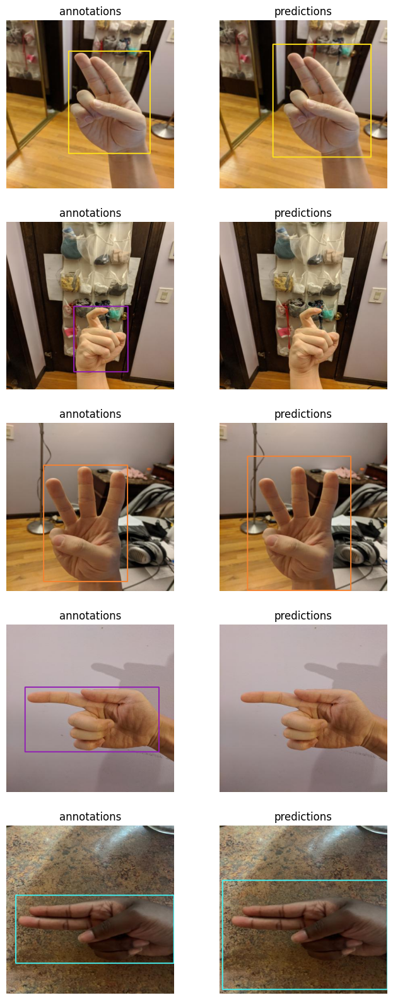

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [ ]:
!pip install onemetric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 2.6 MB/s eta 0:00:00


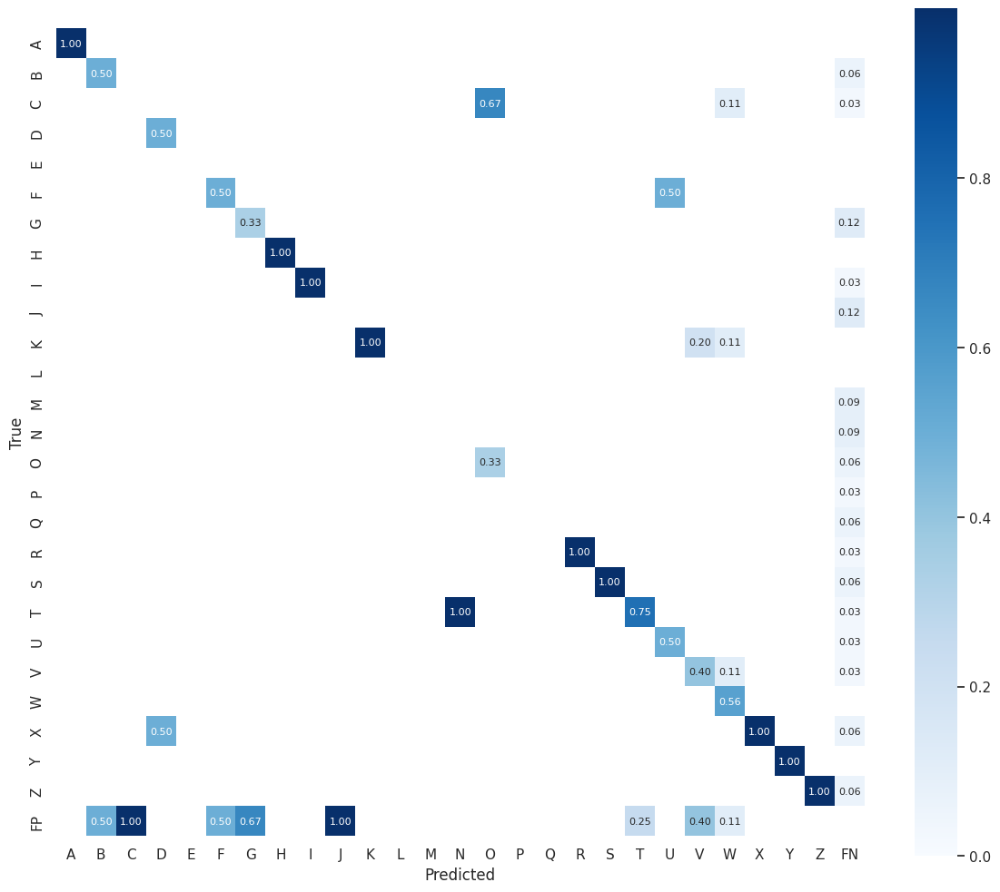

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

[2023-10-28 18:56:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


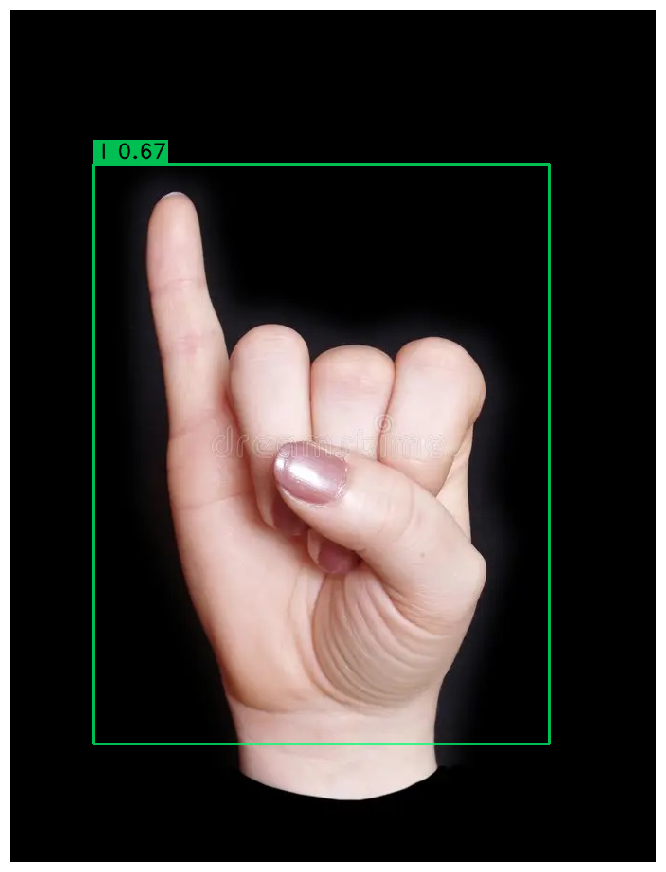

In [ ]:
test_image = '/content/i-letter.jpg'
best_model.predict(test_image).show()

In [ ]:
test_image = '/content/i-letter.jpg'
best_model.predict(test_image).show()

[2023-10-28 18:57:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


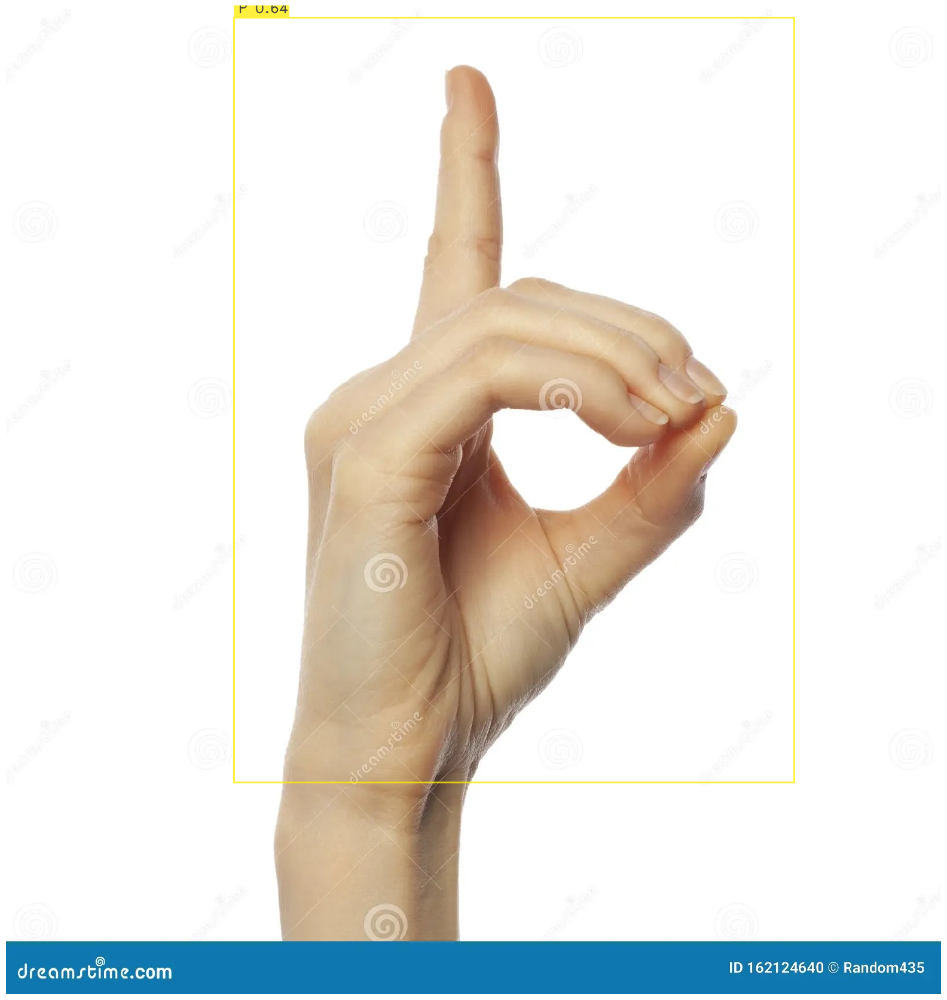

In [ ]:
test_image = '/content/finger.jpg'
best_model.predict(test_image).show()

In [ ]:
import gc
gc.collect()

15704

In [ ]:
import torch
device = 0 if torch.cuda.is_available() else "cpu"

input_video_path = "/content/hi-sign-3.mp4"
output_video_path = "/content/hi-detections-3.mp4"
#device=0

best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 370/370 [00:08<00:00, 43.17it/s]
